<a href="https://colab.research.google.com/github/bitue/Linear_reg_coursera/blob/nlp_assignment_3/Assignment_3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [3]:
from cProfile import label
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import re


def filter_to_sentiment (x):
    if x==4 :
        return 'Positive'
    else :
        return "Negative"


def load_data (file_path):
    df = pd.read_csv(file_path, header=None , encoding='latin-1', names=['target', 'id', 'date', 'meta', 'user', 'text'])
    # print(df.info())
    # print("after that i confirmed there is no null value ")
    print(df.head(10))
    df['sentiment'] = df['target'].apply(filter_to_sentiment)
    df.drop(columns=['id', 'date', 'meta', 'user'], inplace=True)
    return df

df = load_data("/content/drive/MyDrive/Colab Notebooks/data_sets/data.csv")
print(df.head(10))


   target          id                          date      meta  \
0       0  1467810369  Mon Apr 06 22:19:45 PDT 2009  NO_QUERY   
1       0  1467810672  Mon Apr 06 22:19:49 PDT 2009  NO_QUERY   
2       0  1467810917  Mon Apr 06 22:19:53 PDT 2009  NO_QUERY   
3       0  1467811184  Mon Apr 06 22:19:57 PDT 2009  NO_QUERY   
4       0  1467811193  Mon Apr 06 22:19:57 PDT 2009  NO_QUERY   
5       0  1467811372  Mon Apr 06 22:20:00 PDT 2009  NO_QUERY   
6       0  1467811592  Mon Apr 06 22:20:03 PDT 2009  NO_QUERY   
7       0  1467811594  Mon Apr 06 22:20:03 PDT 2009  NO_QUERY   
8       0  1467811795  Mon Apr 06 22:20:05 PDT 2009  NO_QUERY   
9       0  1467812025  Mon Apr 06 22:20:09 PDT 2009  NO_QUERY   

              user                                               text  
0  _TheSpecialOne_  @switchfoot http://twitpic.com/2y1zl - Awww, t...  
1    scotthamilton  is upset that he can't update his Facebook by ...  
2         mattycus  @Kenichan I dived many times for the ball. Man..

In [4]:
pos_value = len(df[df['sentiment'] == "Positive"])
neg_value = len(df[df['sentiment'] == "Negative"])
print(pos_value, neg_value)

800000 800000


In [5]:
avg_len_of_text = df['text'].apply(lambda x : len(x.split())).mean()
print(avg_len_of_text)

13.176150625


In [6]:
df['text_length'] = df['text'].apply(lambda x : len(x.split()))
df

,target,text,sentiment,text_length
0,0,"@switchfoot http://twitpic.com/2y1zl - Awww, t...",Negative,19
1,0,is upset that he can't update his Facebook by ...,Negative,21
2,0,@Kenichan I dived many times for the ball. Man...,Negative,18
3,0,my whole body feels itchy and like its on fire,Negative,10
4,0,"@nationwideclass no, it's not behaving at all....",Negative,21
...,...,...,...,...
1599995,4,Just woke up. Having no school is the best fee...,Positive,11
1599996,4,TheWDB.com - Very cool to hear old Walt interv...,Positive,11
1599997,4,Are you ready for your MoJo Makeover? Ask me f...,Positive,11
1599998,4,Happy 38th Birthday to my boo of alll time!!! ...,Positive,12


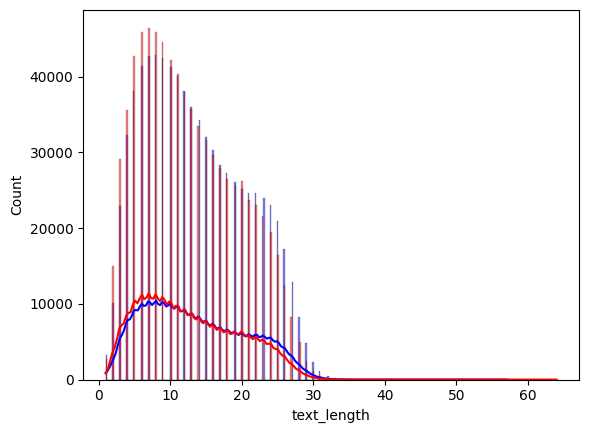

In [8]:
sns.histplot(df[df['sentiment'] == 'Negative']['text_length'], kde=True, color='blue')
sns.histplot(df[df['sentiment'] == 'Positive']['text_length'], kde=True, color='red')
plt.show()

In [9]:
 def clean_text(text):
    # Remove punctuation and convert to lowercase
    text = re.sub(r'[^\w\s]', '', text).lower()
    # Split into words
    return text.split()

# Apply the clean_text function to the 'text' column
df['cleaned_text'] = df['text'].apply(clean_text)

In [10]:
df


,target,text,sentiment,text_length,cleaned_text
0,0,"@switchfoot http://twitpic.com/2y1zl - Awww, t...",Negative,19,"[switchfoot, httptwitpiccom2y1zl, awww, thats,..."
1,0,is upset that he can't update his Facebook by ...,Negative,21,"[is, upset, that, he, cant, update, his, faceb..."
2,0,@Kenichan I dived many times for the ball. Man...,Negative,18,"[kenichan, i, dived, many, times, for, the, ba..."
3,0,my whole body feels itchy and like its on fire,Negative,10,"[my, whole, body, feels, itchy, and, like, its..."
4,0,"@nationwideclass no, it's not behaving at all....",Negative,21,"[nationwideclass, no, its, not, behaving, at, ..."
...,...,...,...,...,...
1599995,4,Just woke up. Having no school is the best fee...,Positive,11,"[just, woke, up, having, no, school, is, the, ..."
1599996,4,TheWDB.com - Very cool to hear old Walt interv...,Positive,11,"[thewdbcom, very, cool, to, hear, old, walt, i..."
1599997,4,Are you ready for your MoJo Makeover? Ask me f...,Positive,11,"[are, you, ready, for, your, mojo, makeover, a..."
1599998,4,Happy 38th Birthday to my boo of alll time!!! ...,Positive,12,"[happy, 38th, birthday, to, my, boo, of, alll,..."


In [13]:
from collections import Counter

# Flatten the list of words


all_words = [word for text in df['cleaned_text'] for word in text ]


word_counts = Counter(all_words)

print(word_counts)

Counter({'i': 750749, 'to': 564518, 'the': 520037, 'a': 377506, 'my': 314039, 'and': 298369, 'you': 270069, 'is': 236006, 'it': 230843, 'for': 215692, 'in': 214201, 'of': 183428, 'im': 177478, 'on': 167078, 'me': 160074, 'so': 150709, 'have': 144505, 'that': 141325, 'but': 127457, 'just': 125053, 'with': 114866, 'be': 112521, 'at': 111280, 'its': 108027, 'not': 106355, 'was': 104073, 'this': 92983, 'now': 90357, 'good': 89398, 'up': 88449, 'day': 82363, 'get': 81484, 'all': 80707, 'out': 80516, 'like': 77748, 'are': 77696, 'no': 73515, 'go': 72911, 'dont': 66923, 'do': 65962, 'your': 64996, 'today': 64601, 'too': 64204, 'going': 64087, 'love': 63463, 'work': 62843, 'cant': 62597, 'got': 60752, 'time': 56107, 'from': 55996, 'back': 55974, 'lol': 55146, 'u': 52775, 'what': 52204, 'one': 52185, 'will': 51829, 'know': 51193, 'we': 50902, 'about': 50207, 'really': 49550, 'am': 49344, 'had': 47678, 'can': 46952, 'see': 45833, 'some': 45328, 'well': 44412, 'if': 42996, 'still': 42800, 'want':

In [21]:
co = set(Counter(all_words).most_common(10))
print(co)

{('and', 298369), ('for', 215692), ('i', 750749), ('it', 230843), ('is', 236006), ('you', 270069), ('the', 520037), ('my', 314039), ('a', 377506), ('to', 564518)}


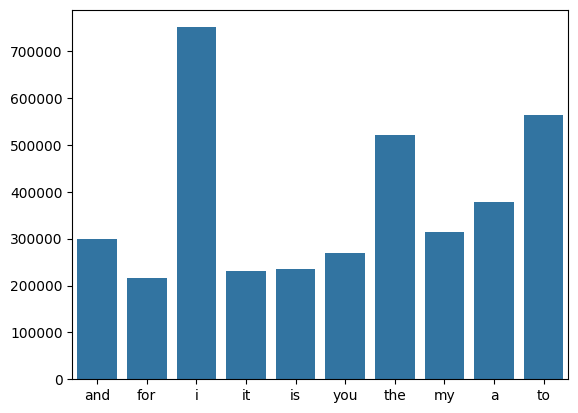

In [22]:
sns.barplot(x=[word[0] for word in co], y=[word[1] for word in co])
plt.show()